# Dall-E 3 with Azure Open AI (Text to Image)

DALL-E 3 is the latest image generation model from OpenAI. It features enhanced image quality, more complex scenes, and improved performance when rendering text in images. It also comes with more aspect ratio options. DALL-E 3 is available through OpenAI Studio and through the REST API.

In [1]:
def check_openai_version():
    """
    Check Azure Open AI version
    """
    import openai
    
    oai_version = openai.__version__

    try:
        version_number = float(oai_version[:3])
    except ValueError:
        print("Cannot get Azure Open AI version")
        return

    print(f"Installed OpenAI version: {oai_version}")

    if version_number < 1.0:
        print("You should upgrade OpenAI to have version >= 1.0")
        print("To upgrade, run: %pip install openai --upgrade")
    else:
        print(f"Current version is >= 1.0 : OK")


check_openai_version()

Installed OpenAI version: 1.3.5
Current version is >= 1.0 : OK


In [2]:
import datetime
import glob
import json
import openai
import os
import requests
import sys
import time

from dotenv import load_dotenv
from openai import AzureOpenAI
from matplotlib import pyplot as plt
from PIL import Image

In [3]:
load_dotenv("azure.env")

# Azure Open AI
openai.api_type: str = "azure"
api_key = os.getenv("OPENAI_API_KEY")
api_base = os.getenv("OPENAI_API_BASE")
api_version = "2023-12-01-preview"
print("Open AI version:", openai.__version__)

Open AI version: 1.3.5


In [4]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

In [5]:
print(f"Today is {datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S')}")

Today is 29-Nov-2023 09:41:39


## Directory to save the generated images

In [6]:
images_dir = "dalle3_images"

os.makedirs(images_dir, exist_ok=True)

## Function

In [7]:
client = AzureOpenAI(
    api_version=api_version,
    azure_endpoint=api_base,
    api_key=api_key,
)

In [9]:
def dalle3(prompt, size="1792x1024", quality="hd", style="natural"):
    """
    Dall e3 image
    """
    result = client.images.generate(
        model="dalle3",  # Name of the Dall e3 deployed model
        prompt=prompt,  # Prompt
        n=1,  # Number of images
        size=size,  # 1792x1024 or 1024x1024 or 1024x1792
        quality=quality,  # hd or standard
        style=style,  # natural or vivid
    )
    # Loading the json results
    results = json.loads(result.model_dump_json())
    # Getting the url image (the first one)
    dalleimage = requests.get(results["data"][0]["url"]).content
    # Saving the image as a local file
    dt = str(datetime.datetime.today().strftime("%d%b%Y_%H%M%S").lower())
    image_file = os.path.join(
        images_dir, prompt[:50].replace(",", " ") + "_" + dt + ".png"
    )

    with open(image_file, "wb") as imagefile:
        imagefile.write(dalleimage)

    print(f"\nImage saved: {image_file}")

    # Return the image as a PIL image file
    img = Image.open(image_file)

    return img

## Dall-E3 examples

Un flacon de parfum en métal avec des motifs de fleurs, avec des pétales de roses sur un plateau en acier posé sur une table en marbre

Image saved: dalle3_images/Un flacon de parfum en métal avec des motifs de fl_29nov2023_094219.png


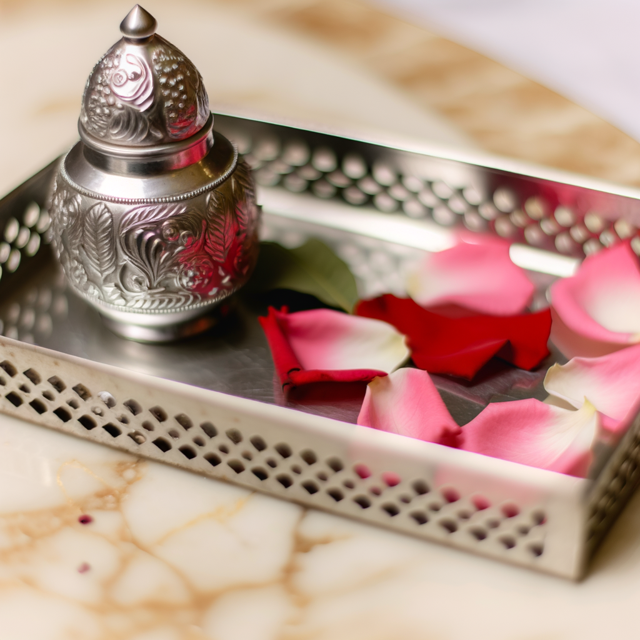

Elapsed time: 00:00:15.945889


In [10]:
start = time.time()

prompt = "Un flacon de parfum en métal avec des motifs de fleurs, avec des pétales de roses \
sur un plateau en acier posé sur une table en marbre"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

A teenage girl looking at the camera with a red cap, polaroid style

Image saved: dalle3_images/A teenage girl looking at the camera with a red ca_29nov2023_094311.png


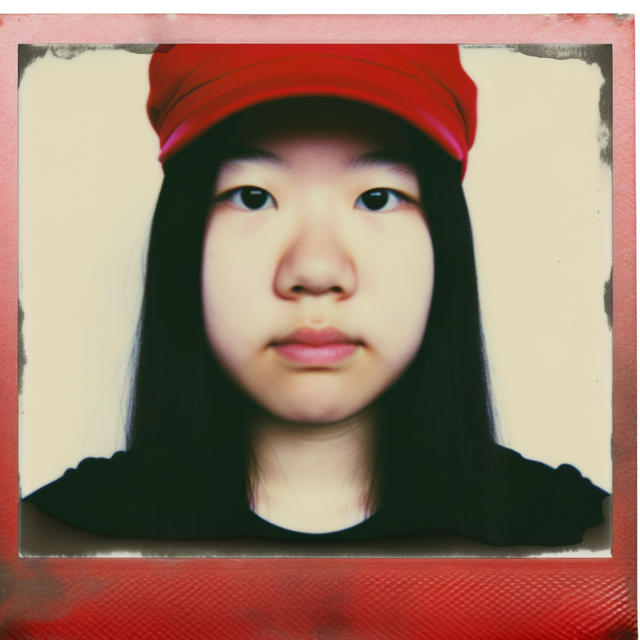

Elapsed time: 00:00:20.790055


In [11]:
start = time.time()

prompt = "A teenage girl looking at the camera with a red cap, polaroid style"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Delicious ice cream in a half sphere waffle with berries and toppings

Image saved: dalle3_images/Delicious ice cream in a half sphere waffle with b_29nov2023_100238.png


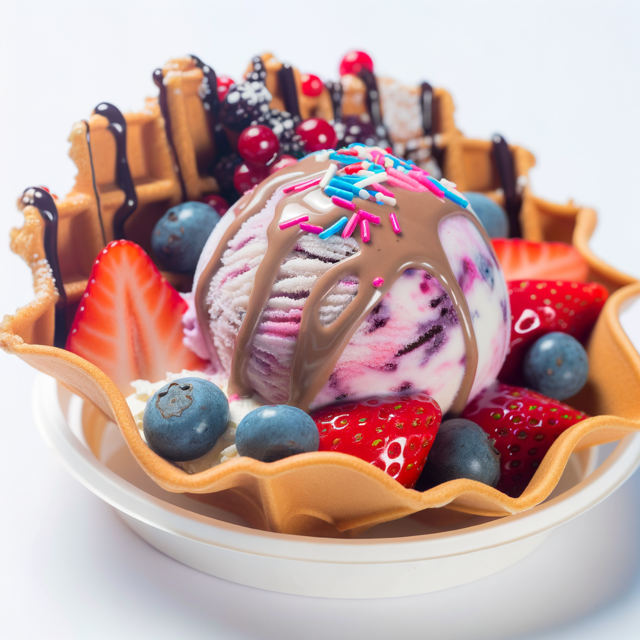

Elapsed time: 00:00:27.956111


In [47]:
start = time.time()

prompt = "Delicious ice cream in a half sphere waffle with berries and toppings"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

A drummer playing drums on a stage, cartoon style, black and white

Image saved: dalle3_images/A drummer playing drums on a stage  cartoon style _29nov2023_094500.png


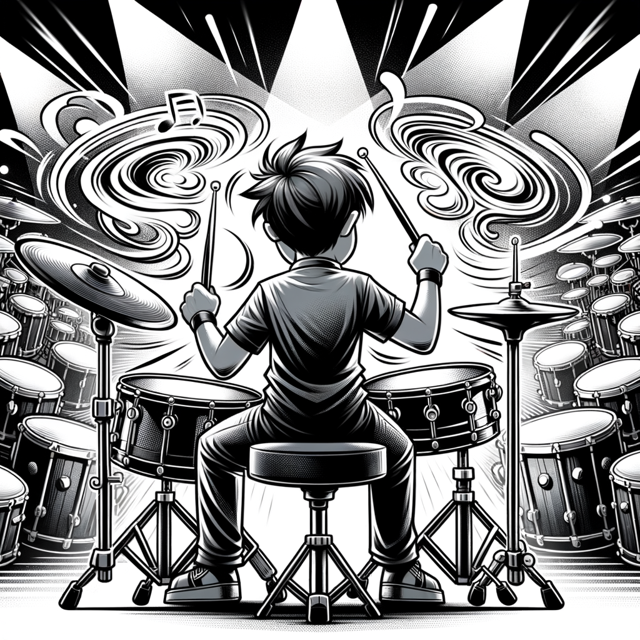

Elapsed time: 00:00:24.090007


In [16]:
start = time.time()

prompt = "A drummer playing drums on a stage, cartoon style, black and white"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

A New York city busy street with people and cars

Image saved: dalle3_images/A New York city busy street with people and cars_29nov2023_094414.png


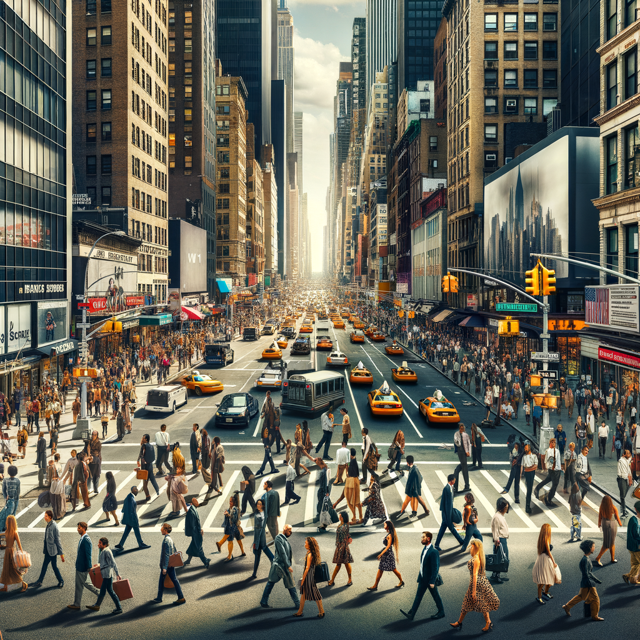

Elapsed time: 00:00:20.831238


In [14]:
start = time.time()

prompt = "A New York city busy street with people and cars"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

A tech YouTuber wearing a black cap with « AI » written on it in white. He is taking a selfie. Polaroid style.

Image saved: dalle3_images/A tech YouTuber wearing a black cap with « AI » wr_29nov2023_094430.png


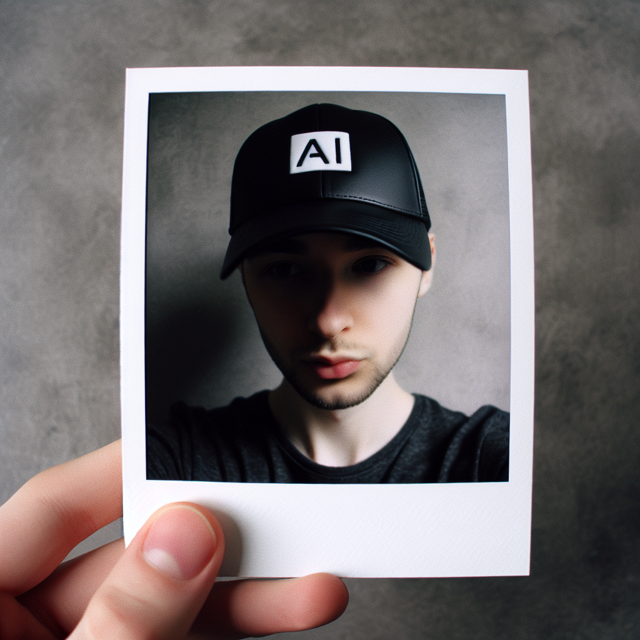

Elapsed time: 00:00:15.311133


In [15]:
start = time.time()

prompt = "A tech YouTuber wearing a black cap with « AI » written on it in white. \
He is taking a selfie. Polaroid style."
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="standard", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

An executive white man, 40 years old, with a small beard, wearing a blue shirt and a tie, realistic image.

Image saved: dalle3_images/An executive white man  40 years old  with a small_29nov2023_094729.png


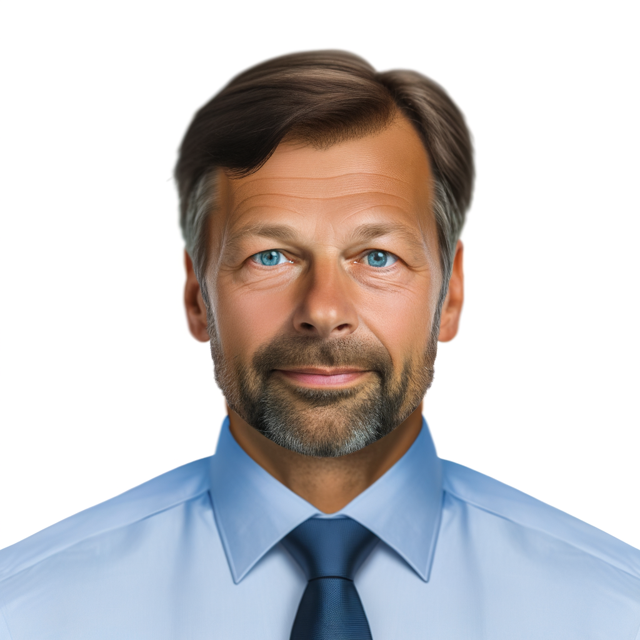

Elapsed time: 00:00:15.279537


In [22]:
start = time.time()

prompt = "An executive white man, 40 years old, with a small beard, wearing a blue shirt and a tie, realistic image."

print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Paris, olympic games, watercolor, sunny day

Image saved: dalle3_images/Paris  olympic games  watercolor  sunny day_29nov2023_094847.png


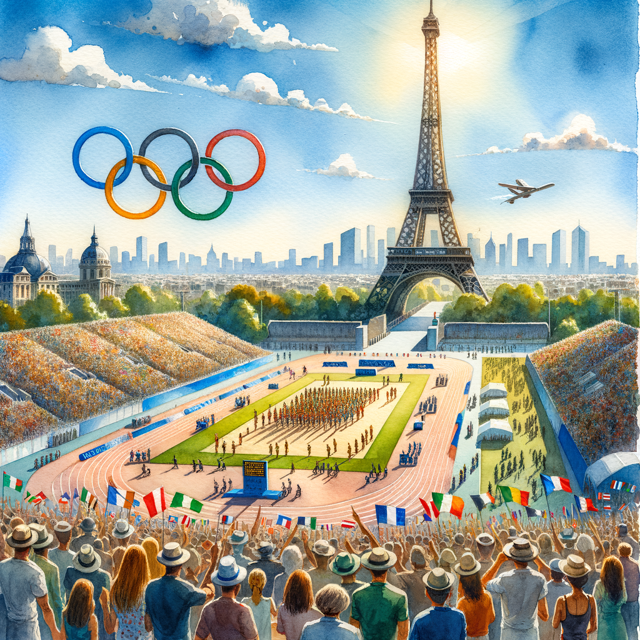

Elapsed time: 00:00:20.210852


In [25]:
start = time.time()

prompt = "Paris, olympic games, watercolor, sunny day"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Paris and the Seine river, watercolor, rainy day

Image saved: dalle3_images/Paris and the Seine river  watercolor  rainy day_29nov2023_094910.png


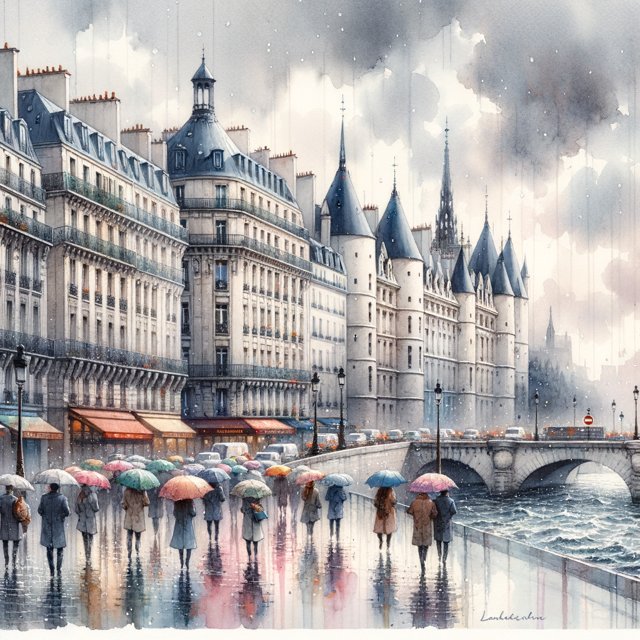

Elapsed time: 00:00:22.296136


In [26]:
start = time.time()

prompt = "Paris and the Seine river, watercolor, rainy day"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Professional photoshoot of a Chemex brewer in the process of brewing coffee.

Image saved: dalle3_images/Professional photoshoot of a Chemex brewer in the _29nov2023_095450.png


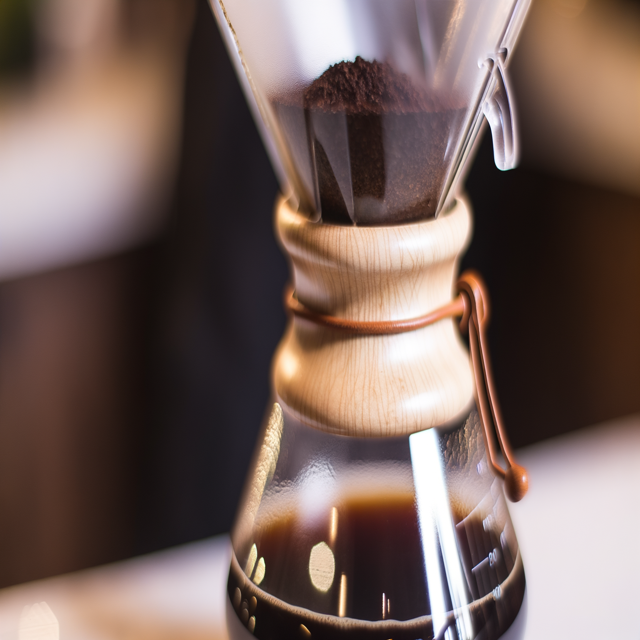

Elapsed time: 00:00:28.944226


In [34]:
start = time.time()

prompt = "Professional photoshoot of a Chemex brewer in the process of brewing coffee."
print(prompt)

img = dalle3(prompt, size="1792x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

A 40 years old man wearing a top hat and smoking a pipe sitting beside a window in a cafeteria while it rains outside in the style of Vincent Van Gogh, realist painting

Image saved: dalle3_images/A 40 years old man wearing a top hat and smoking a_29nov2023_095002.png


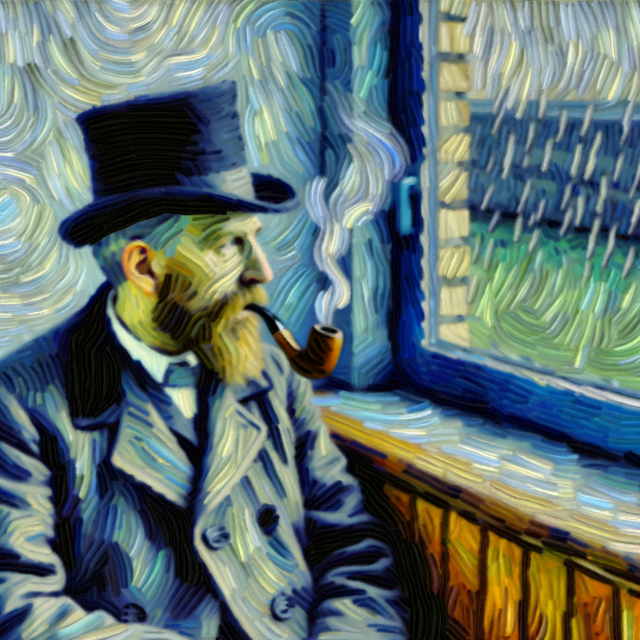

Elapsed time: 00:00:18.229507


In [28]:
start = time.time()

prompt = "A 40 years old man wearing a top hat and smoking a pipe sitting beside a window \
in a cafeteria while it rains outside in the style of Vincent Van Gogh, realist painting"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Scary Terminator in a Paris street, photorealistic, James Cameron, insane details

Image saved: dalle3_images/Scary Terminator in a Paris street  photorealistic_29nov2023_095028.png


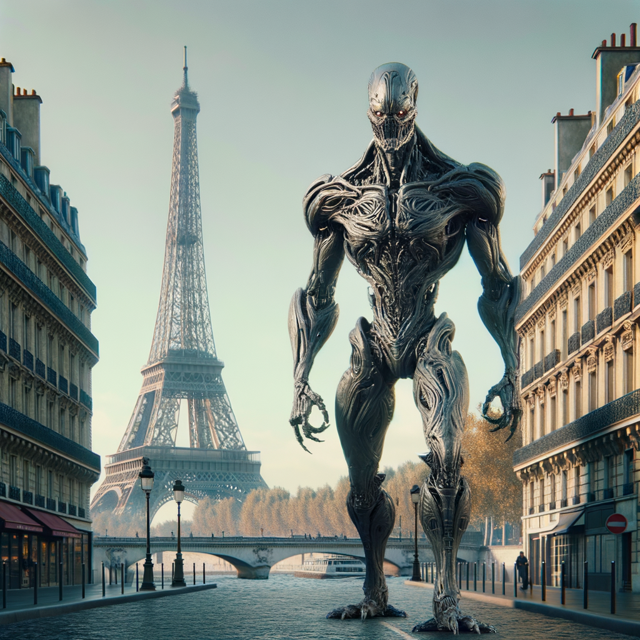

Elapsed time: 00:00:21.718196


In [29]:
start = time.time()

prompt = (
    "Scary Terminator in a Paris street, photorealistic, James Cameron, insane details"
)
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Heavy metal band playing on a stage, smoke and fire atmosphere

Image saved: dalle3_images/Heavy metal band playing on a stage  smoke and fir_29nov2023_095214.png


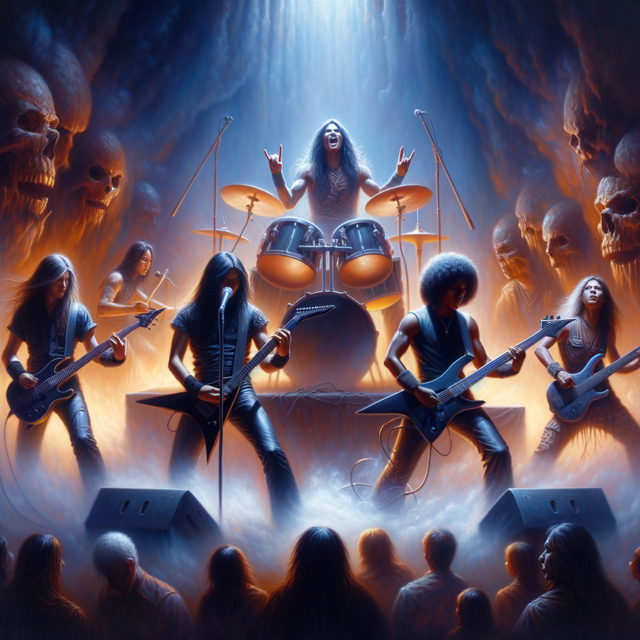

Elapsed time: 00:00:22.908878


In [30]:
start = time.time()

prompt = "Heavy metal band playing on a stage, smoke and fire atmosphere"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Beautiful Na'vi under water, avatar, photorealistic, James Cameron, insane details

Image saved: dalle3_images/Beautiful Na'vi under water  avatar  photorealisti_29nov2023_095509.png


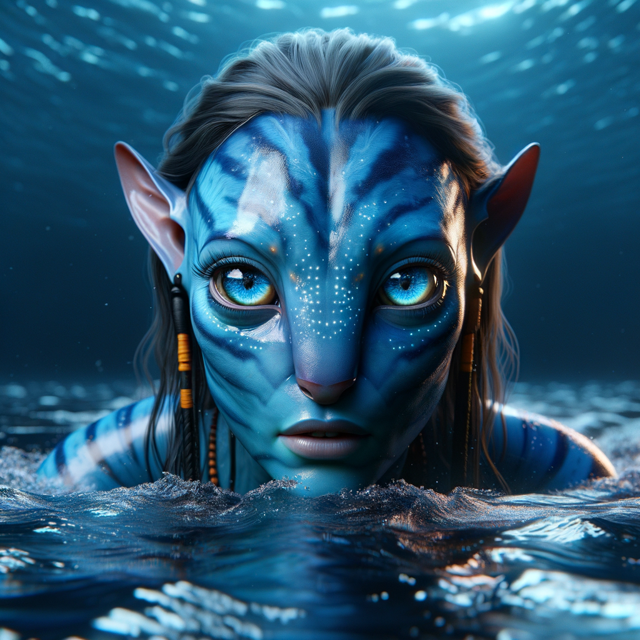

Elapsed time: 00:00:18.814084


In [35]:
start = time.time()

prompt = (
    "Beautiful Na'vi under water, avatar, photorealistic, James Cameron, insane details"
)
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Children playing in the street, realistic, in the style of Edward Hopper

Image saved: dalle3_images/Children playing in the street  realistic  in the _29nov2023_095526.png


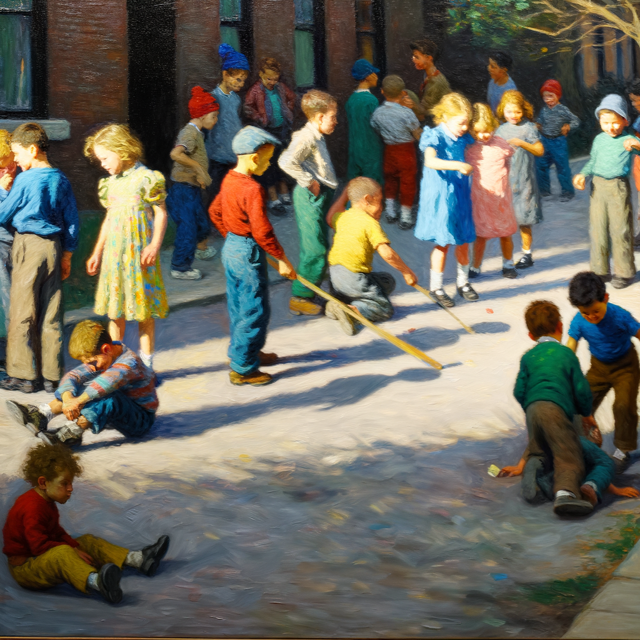

Elapsed time: 00:00:16.786303


In [36]:
start = time.time()

prompt = "Children playing in the street, realistic, in the style of Edward Hopper"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Children playing in the street in the style of Andy Warhol

Image saved: dalle3_images/Children playing in the street in the style of And_29nov2023_095545.png


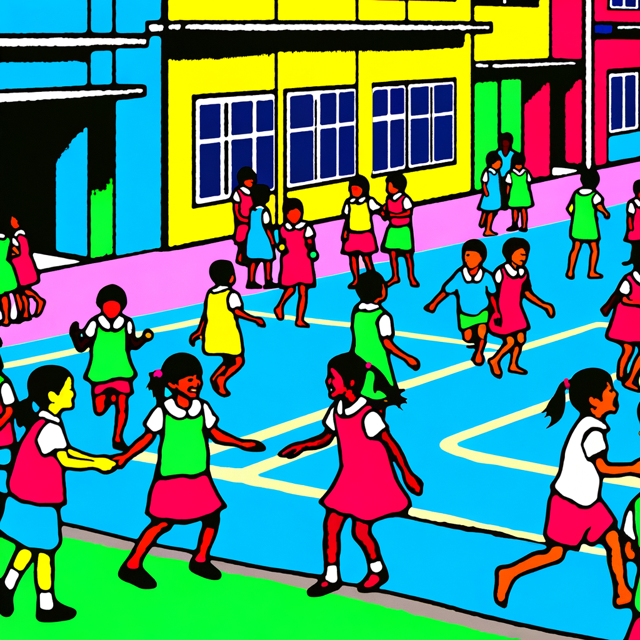

Elapsed time: 00:00:18.336701


In [37]:
start = time.time()

prompt = "Children playing in the street in the style of Andy Warhol"
print(prompt)

img = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Early morning photography of a landscape shrouded in mist, with diffused light and long shadows.

Image saved: dalle3_images/Early morning photography of a landscape shrouded _29nov2023_095621.png


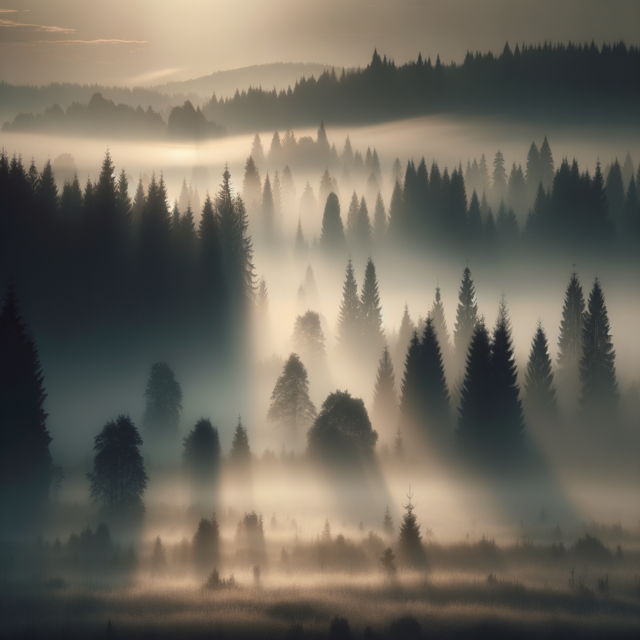

Elapsed time: 00:00:36.121413


In [38]:
start = time.time()

prompt = "Early morning photography of a landscape shrouded in mist, with diffused light and long shadows."
print(prompt)

img = dalle3(prompt, size="1792x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Landscape photography of snow-covered mountain peaks at sunrise, using natural light.

Image saved: dalle3_images/Landscape photography of snow-covered mountain pea_29nov2023_095733.png


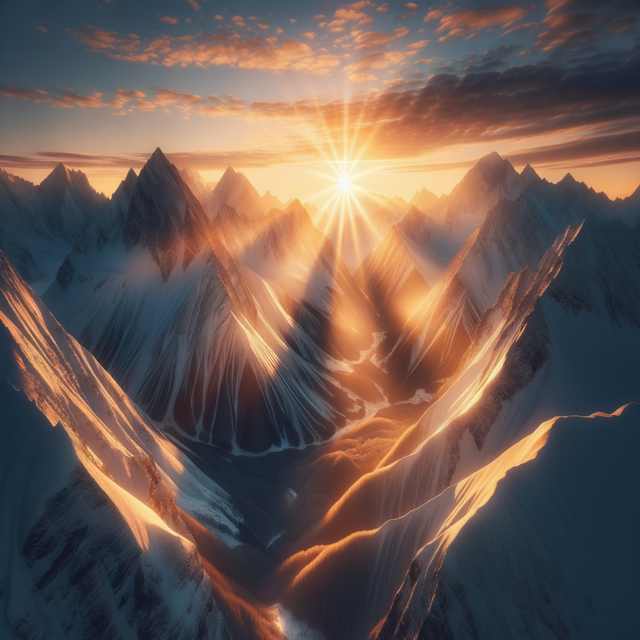

Elapsed time: 00:00:28.102696


In [40]:
start = time.time()

prompt = "Landscape photography of snow-covered mountain peaks at sunrise, using natural light."
print(prompt)

img = dalle3(prompt, size="1792x1024", quality="hd", style="vivid")
elapsed = time.time() - start
display(img.resize((640, 640)))

print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))